In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import os

%matplotlib inline

In [2]:
#Function to load images from a folder
def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        img = mpimg.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images
print("hellogggg")

hellogggg


corners not detected for image number 2


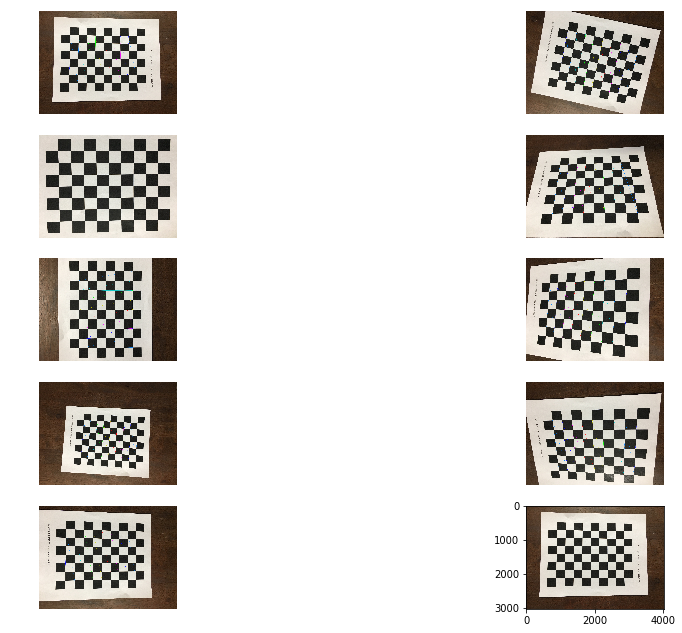

In [3]:

#Setting up figure properties to display
fig, axs = plt.subplots(5,2, figsize=(16, 11))
axs = axs.ravel()

#Loading Images from folder camera_cal into list images
images = load_images("camera_cal2/")
obj_pts = []# 3D points from real world space
img_pts = []# 2D points from image plane

# After looking at the given chessboard images, chose number of corners along x and y directions as below
corners_x = 7
corners_y = 9
objp = np.zeros((corners_y*corners_x,3), np.float32)
objp[:,:2] = np.mgrid[0:corners_x,0:corners_y].T.reshape(-1,2) # x y coordinates

# for each image in camera_cal folder, detecting corners and drawing them on original image
for i,image_corners in enumerate(images):
    cv2.imwrite(os.path.join('chessboard_corner_images2', 'original_image'+str(i)+'.jpg'), image_corners)
    gray = cv2.cvtColor(image_corners,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (corners_x,corners_y), None)   
    if ret == True:
        img_pts.append(corners)
        obj_pts.append(objp)
        image_corners = cv2.drawChessboardCorners(image_corners, (corners_x,corners_y), corners, ret)
    else:
        print('corners not detected for image number', i) 
    axs[i].axis('off')
    axs[i].imshow(image_corners)
    cv2.imwrite(os.path.join('chessboard_corner_images2', 'corners_drawn'+str(i)+'.jpg'), image_corners)
    


In [4]:
# Function to Calibrate a camera, given an image snapped from that camera 
# This function returns dist-distortion coefficients, mtx- camera mcatrix
def calibrate_camera(img, obj_pts, img_pts):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pts, img_pts, gray.shape[::-1], None, None)   
    return ret, mtx, dist

# Calibrating Camera
ret, mtx, dist = calibrate_camera(images[0], obj_pts, img_pts)

# Function to undistort provided distorted image
def undistort_image(img, ret, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [21]:
#Loading Images from folder test_images into list images to undistort them
dist_images = load_images("test_images2/")

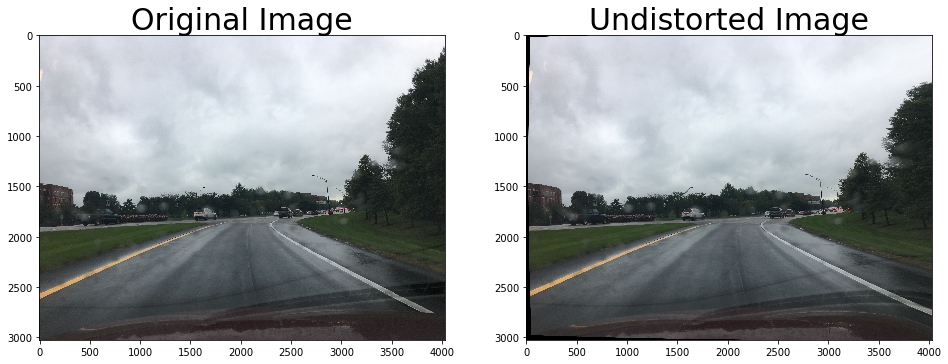

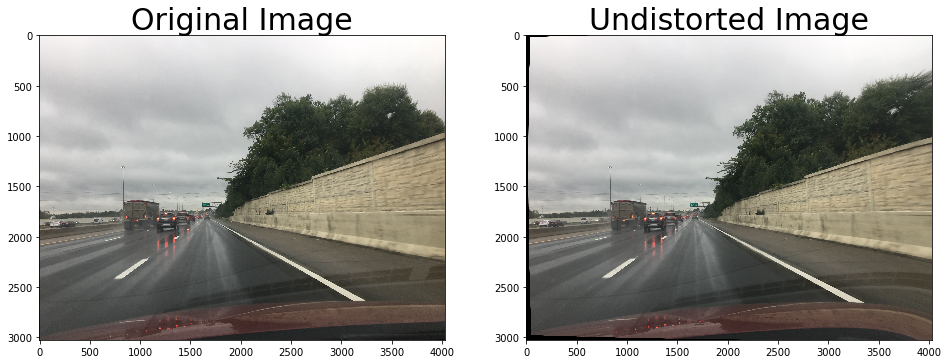

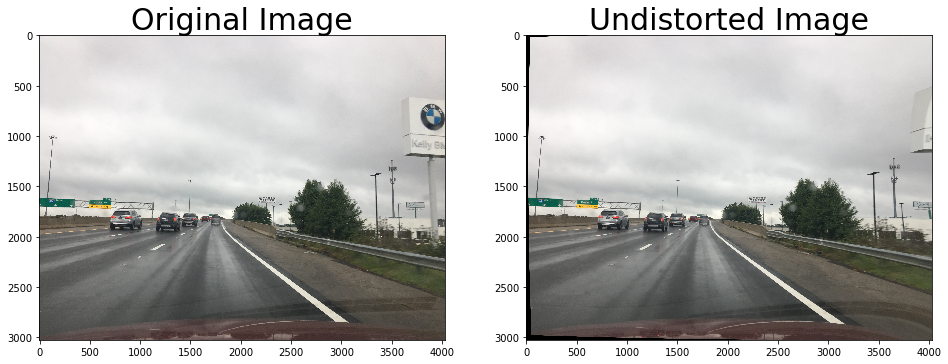

In [22]:

# Undistorting each image using camera matrix and distortion coefficient
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(dist_img)
    cv2.imwrite(os.path.join('undist_test_images2', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))
    undist_img = undistort_image(dist_img, ret, mtx, dist)    
    ax2.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(undist_img)
    cv2.imwrite(os.path.join('undist_test_images2', 'undist_image'+str(i)+'.jpg'), cv2.cvtColor(undist_img, cv2.COLOR_RGB2BGR))

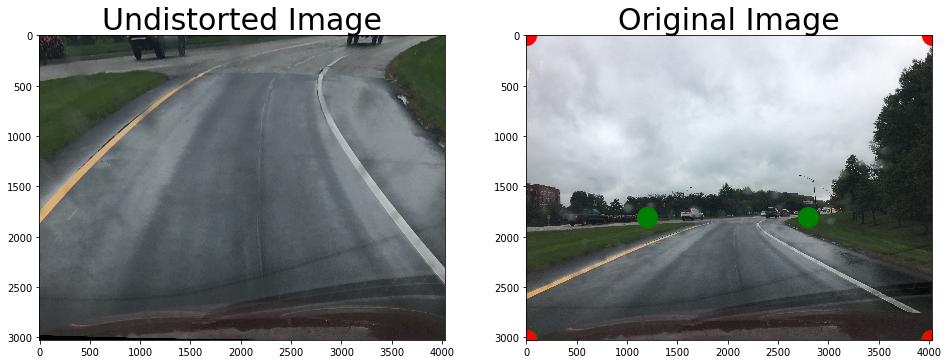

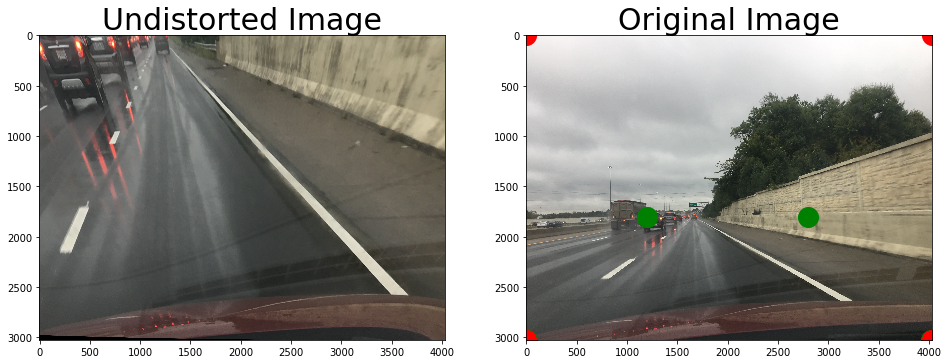

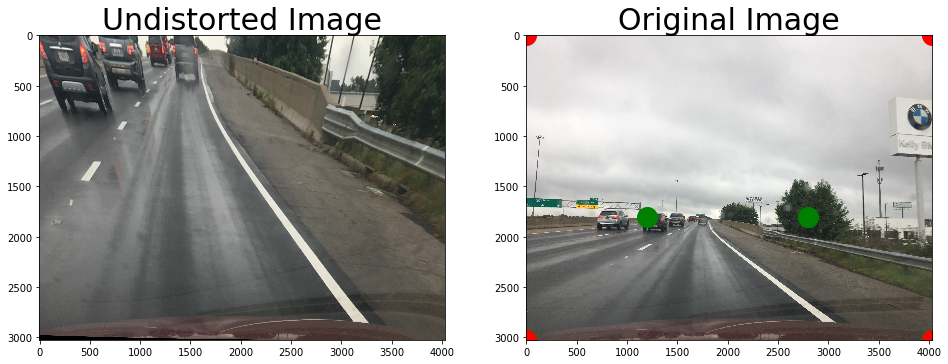

In [23]:

# Below function transforms given distorted image to desired perspective using src and dst points
def perspective_transform(img, ret, mtx, dist, src, dst):
    #Undistorting passed distorted image
    h, w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Using cv2.warpPerspective() to warp image to a top-down view          
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)    
    return warped, M, Minv
    

# Applying perspective transform to each image
for i,dist_img in enumerate(dist_images):
    
    # Source points
    #src=np.float32([[270,720],[580,480],[800,480],[1200,720]])
    # destination points. Chosen these to get birds eye view
    #dst=np.float32([[350,720],[350,0],[960,0],[960,720]])
     
    undist_img = undistort_image(dist_img, ret, mtx, dist) 
    h, w = undist_img.shape[:2]
    src = np.float32(
    [[1200, 1800],
    [10, h],
    [w-10, h],
    [2800, 1800]])
    dst = np.float32(
    [[0, 0],
    [0, h],
    [w, h],
    [w, 0]])
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    for pt in src:
        plt.plot(*pt,'go',markersize=20)
    for pt in dst:
        plt.plot(*pt,'ro',markersize=20)
    ax2.set_title('Original Image', fontsize=30)
    ax2.imshow(dist_img)
    cv2.imwrite(os.path.join('perspective_transform_test_images2', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))  
    ax1.set_title('Undistorted Image', fontsize=30)
    ax1.imshow(top_down_warped)
    cv2.imwrite(os.path.join('perspective_transform_test_images2', 'birds_view_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  



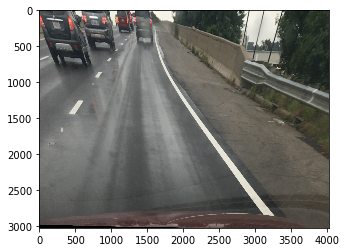

In [24]:
undist_img = undistort_image(dist_images[2], ret, mtx, dist) 
top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst) 

plt.imshow(top_down_warped)

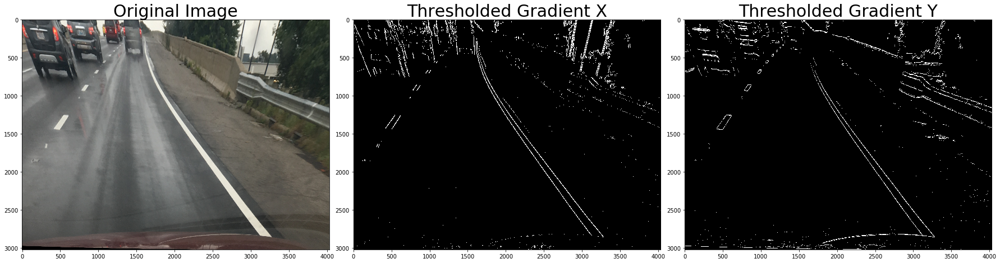

In [84]:

# Below Function does sobel gradient thresholding
def abs_sobel_thresh(img, thresh=(0,255), orient='x'):
    # Converting image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
       sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
       sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # Taking the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # Scaling to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Creating a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Returning this mask as binary image
    return sbinary

 
# Obtaining binary gradients along x and y for an image from test_images folder
grad_binary_x = abs_sobel_thresh(top_down_warped, thresh = (20, 250) , orient='x')
grad_binary_y = abs_sobel_thresh(top_down_warped, thresh = (20, 250) , orient='y')


# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary_x, cmap='gray')
ax2.set_title('Thresholded Gradient X', fontsize=30)
ax3.imshow(grad_binary_y, cmap='gray')
ax3.set_title('Thresholded Gradient Y', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



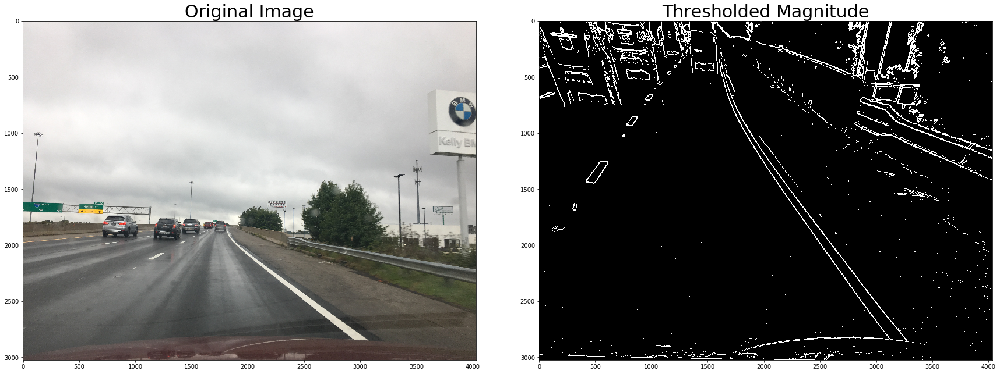

In [85]:
# Below Function computes magnitude of gradient 
def mag_thresh(img, sobel_kernel=3, mag_thresh=(180,255)):
    
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculating the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scaling to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    # Creating a binary mask where mag thresholds are met
    s_binary = np.zeros_like(scaled_sobel)
    s_binary[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1   
    return s_binary
    
# Obtaining binary image of magnitude of gradients along x and y directions for chosen thresholds    
mag_binary = mag_thresh(top_down_warped, sobel_kernel=5, mag_thresh=(20, 250))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dist_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



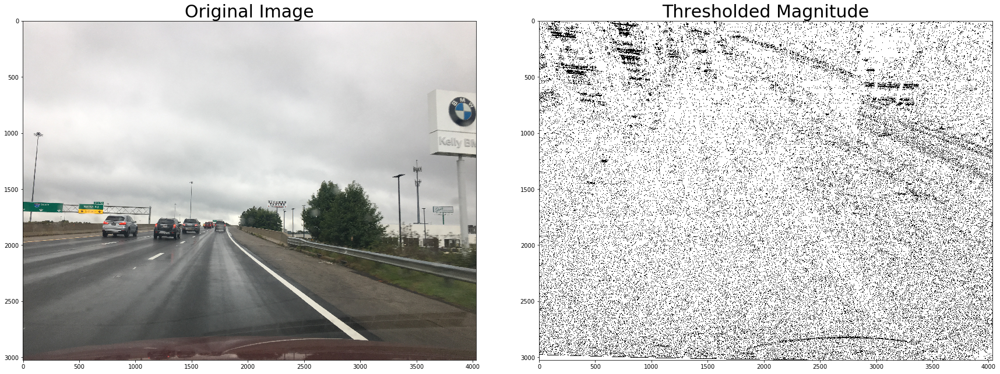

In [86]:
# # Below Function computes direction of gradient 
def dir_threshold(img, sobel_kernel=3, thresh=(0,np.pi/2)):
    
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel )
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Taking the absolute value of the x and y gradients
    # Using np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Returning this mask as binary_output image
    return binary_output
    
# Running the function for chosen threshold values
dir_binary = dir_threshold(top_down_warped, sobel_kernel=3, thresh=(0, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dist_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)





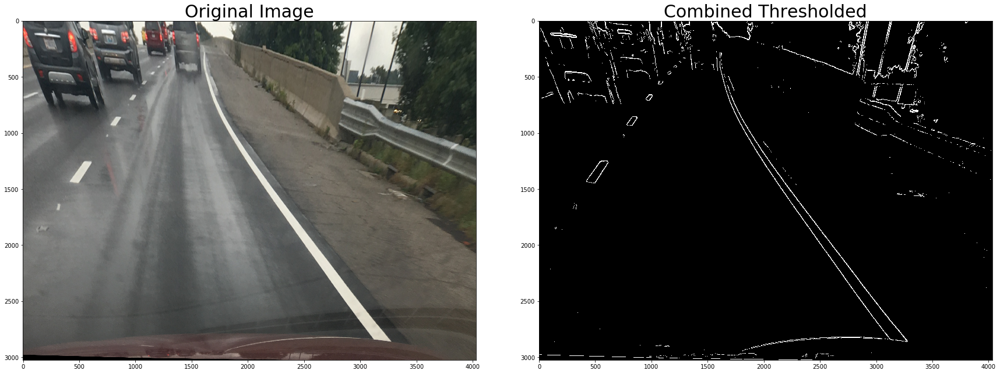

In [87]:
 # Below function computes magnitude and direction of gradients along x and y direction 
 # and applies thresholding for chosen threshold values
def gradient_threshold(img, thresh_sx= (20, 200), thresh_sy= (10, 60), 
                       thresh_mag= (20, 150), thresh_dir= (0, np.pi/2), ksize=3):
    
    gradx = abs_sobel_thresh(img, thresh_sx, orient='x',)
    grady = abs_sobel_thresh(img, thresh_sy, orient='y',)
    #print(ksize)
    mag_binary = mag_thresh(img, ksize, thresh_mag)
    dir_binary = dir_threshold(img, ksize, thresh_dir)

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) )] = 1
    return combined

# Running the function
combined = gradient_threshold(top_down_warped, thresh_sx= (20, 250), thresh_sy= (20, 250), 
                       thresh_mag= (40, 170), thresh_dir= (0, 1.3), ksize = 5)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Thresholded', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

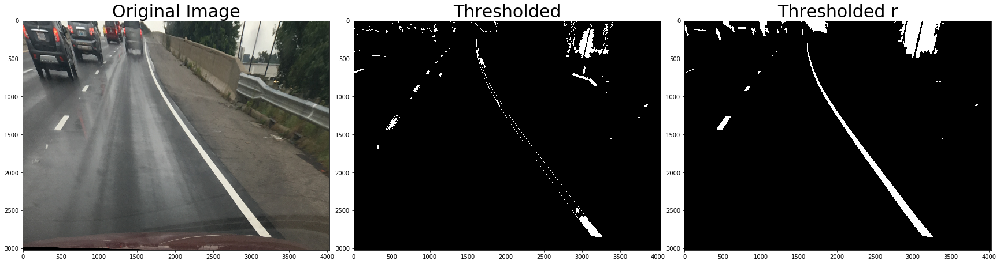

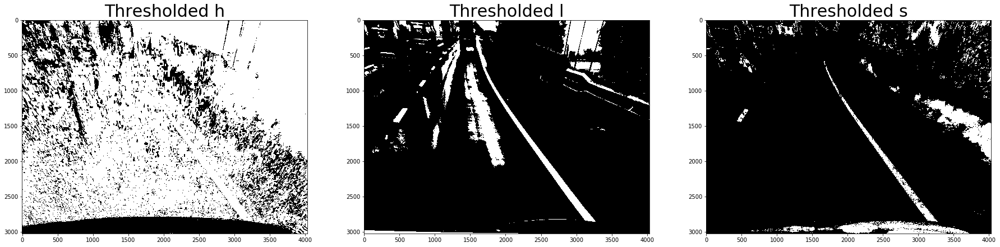

In [88]:
# Below function does RGB and HLS color tranform and applies thresholding for chosen threshold values 

def color_threshold(img, thresh, thresh_r, thresh_h, thresh_l, thresh_s ):
    
    binary_thresh = np.copy(img) # placeholder line
    binary_r = np.copy(img) # placeholder line
    binary_h = np.copy(img) # placeholder line
    binary_l = np.copy(img) # placeholder line
    binary_s = np.copy(img) # placeholder line
    
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    # r Channel Thresholding
    binary_r = np.zeros_like(r)
    binary_r[(r >= thresh_r[0]) & (r <= thresh_r[1])] = 1
    #plt.imshow(binary_R)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary_thresh = np.zeros_like(gray)
    binary_thresh[(gray >= thresh[0]) & (gray <= thresh[1])] = 1
    #plt.imshow(binary_thresh)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    l = hls[:,:,1]
    s = hls[:,:,2]
    binary_h = np.zeros_like(h)
    binary_h[(h >= thresh_h[0]) & (h <= thresh_h[1])] = 1
    binary_l = np.ones_like(l)
    binary_l[(l >= thresh_l[0]) & (l <= thresh_l[1])] = 0
    binary_s = np.zeros_like(s)
    binary_s[(s >= thresh_s[0]) & (s <= thresh_s[1])] = 1
    

    return  binary_thresh, binary_r, binary_h, binary_l, binary_s

# Running the function for chosen threshold values
binary_thresh, binary_r, binary_h, binary_l, binary_s = color_threshold(top_down_warped, 
                                                                        thresh= (170, 220), thresh_r= (200, 255), 
                                                                        thresh_h= (20, 100), thresh_l= (25, 140), 
                                                                        thresh_s= (40, 70))

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(top_down_warped)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(binary_thresh, cmap='gray')
ax2.set_title('Thresholded', fontsize=30)
ax3.imshow(binary_r, cmap='gray')
ax3.set_title('Thresholded r', fontsize=30)

f2, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
ax1.imshow(binary_h, cmap='gray')
ax1.set_title('Thresholded h', fontsize=30)
ax2.imshow(binary_l, cmap='gray')
ax2.set_title('Thresholded l', fontsize=30)
ax3.imshow(binary_s, cmap='gray')
ax3.set_title('Thresholded s', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)







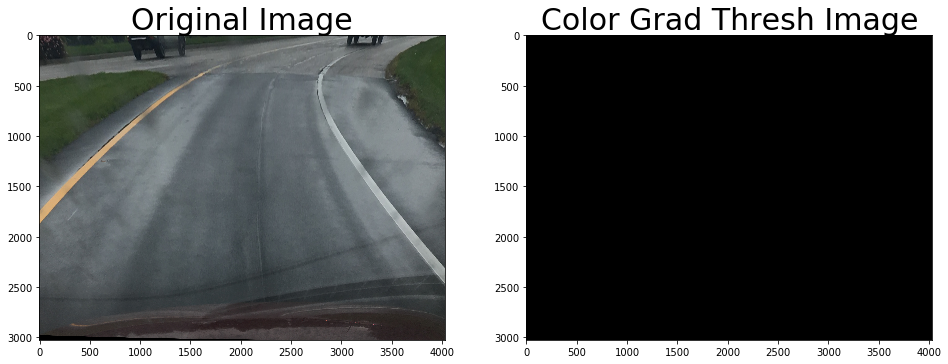

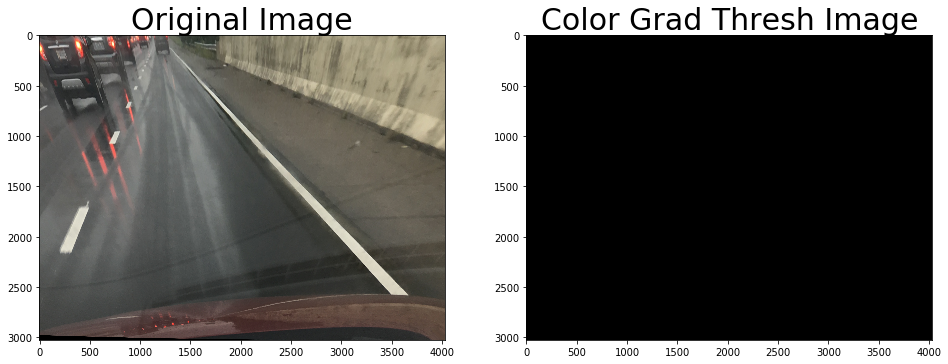

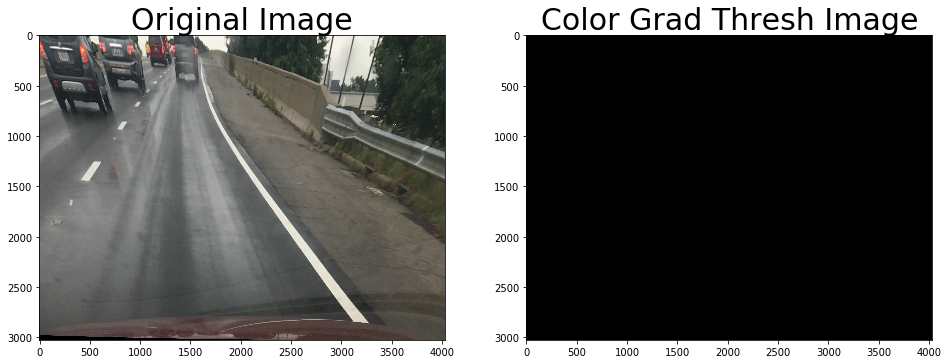

In [111]:
# Below function applies both color and gradient thresholding on an image for chosen threshold values
def color_gradient_threshold(img, thresh = (180, 255), thresh_r = (170, 255),thresh_h = (0, 100), 
                             thresh_s=(170, 255),thresh_l = (25, 140), 
                             thresh_sx=(20, 160), thresh_sy=(20, 100), thresh_mag=(10,100), 
                             thresh_dir=(0.7,1.3), ksize=3):
    img = np.copy(img)
    
    gradient = gradient_threshold(img, thresh_sx, thresh_sy, thresh_mag, thresh_dir, ksize)
    binary_thresh, binary_r, binary_h, binary_l, binary_s = color_threshold(top_down_warped, thresh, thresh_r, 
                                                                            thresh_h, thresh_l, thresh_s)
    
    color = np.zeros_like(binary_r)
    color[ ((binary_r == 1 ) | (binary_s==1)) ] = 1
    # Stack each channel
    #out = np.dstack(( np.zeros_like(gradient), gradient, color))
    out = np.zeros_like(color)
    out[(gradient == 1) | (color == 1)] = 1
    return out

# applying color and gradient thresholding for each test image for a chosen threshold values
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    #ax1[i].axis('off')
    
    undist_img = undistort_image(dist_img, ret, mtx, dist)
    h, w = undist_img.shape[:2]
    src = np.float32(
    [[1200, 1800],
    [10, h],
    [w-10, h],
    [2800, 1800]])
    dst = np.float32(
    [[0, 0],
    [0, h],
    [w, h],
    [w, 0]])
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(top_down_warped)
    #cv2.imwrite(os.path.join('color_threshold_images2', 'original_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    result = color_gradient_threshold(top_down_warped, thresh= (170, 220), thresh_r= (200, 255), 
                                                                        thresh_h= (20, 100), thresh_l= (25, 140), 
                                                                        thresh_s= (40, 70), 
                                                       thresh_sx= (20, 250), thresh_sy= (10, 200), 
                                                       thresh_mag= (20, 140), thresh_dir= (0, 1.3),
                                                       ksize = 5 )
    
    ax2.set_title('Color Grad Thresh Image', fontsize=30)
    ax2.imshow(result)
    #cv2.imwrite(os.path.join('color_threshold_images2', 'color_threshold_image'+str(i)+'.jpg'), result)  
    

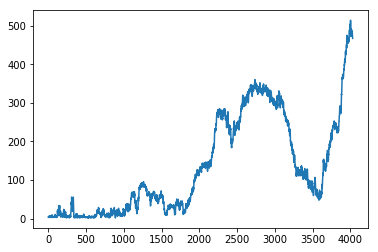

In [90]:
# Below function computes histogram for a given image
def hist(img):
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half =  img[img.shape[0]//2:,:]

    # the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    return histogram

# Creating histogram of image binary activations
histogram = hist(result/255)

# Visualize the resulting histogram
plt.plot(histogram)



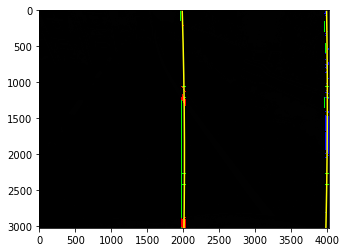

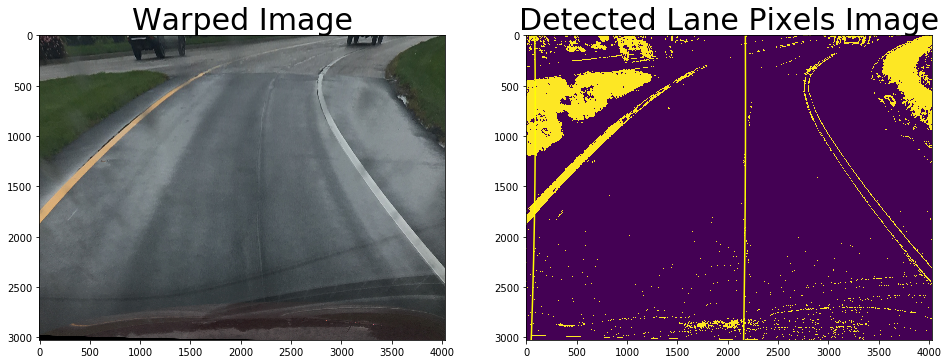

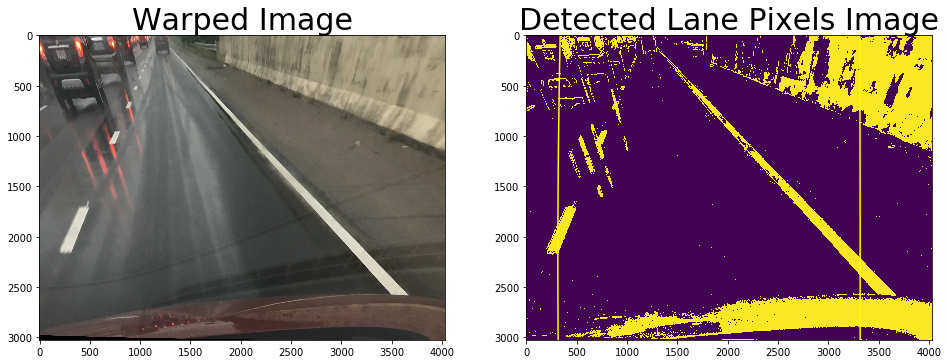

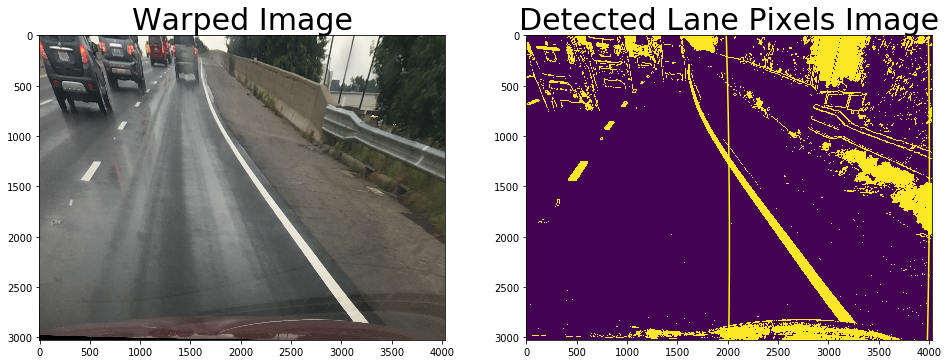

In [102]:

# Below function obtains pixels of left and right lane using sliding window approach
def find_lane_pixels(binary_warped):
    # Taking histogram of the bottom half of the image
    histogram = hist(binary_warped)#np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Creating an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Finding the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #plt.imshow(binary_warped)
    # HYPERPARAMETERS
    # Number of sliding windows
    nwindows = 20
    # Setting the width of the windows +/- margin
    margin = 30
    # Setting minimum number of pixels found to recenter window
    minpix = 300
    
    # Setting height of windows - based on nwindows above an image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identifying the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Creating empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Stepping through the windows one by one
    for window in range(nwindows):
        # Identifying window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Finding the four below boundaries of the window ###
        #print(binary_warped.shape[0])
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Drawing the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### Identifying the nonzero pixels in x and y within the window ###
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox <= win_xright_high)).nonzero()[0]
        
        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        pass 

    # Concatenating the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    ### Fitting a second order polynomial to each using `np.polyfit` ###
    # Fitting a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generating x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')   
    return out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty


# running the fnction
out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(result)
ploty = np.linspace(0, result.shape[0]-1, result.shape[0] )
#Plot the polynomial lines onto the image
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(out_img)
#cv2.imwrite(os.path.join('detected_lane_pixels_images2', 'sliding_window_image.jpg'), out_img)  



# Finding lane pixels in each test image and visualizing sliding windows
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    undist_img = undistort_image(dist_img, ret, mtx, dist)
    h, w = undist_img.shape[:2]
    # source points
    src=np.float32([[300,700],[550,500],[700,500],[1100,700]])
    # destination points. Chosen these to get birds eye view
    dst=np.float32([[350,700],[300,0],[800,0],[1100,700]])
    src = np.float32(
    [[1200, 1800],
    [10, h],
    [w-10, h],
    [2800, 1800]])
    dst = np.float32(
    [[0, 0],
    [0, h],
    [w, h],
    [w, 0]])
    
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    ax1.set_title('Warped Image', fontsize=30)
    ax1.imshow(top_down_warped)
    #cv2.imwrite(os.path.join('detected_lane_pixels_images2', 'warped_original_image'+str(i)+'.jpg'), cv2.cvtColor(top_down_warped, cv2.COLOR_RGB2BGR))  
    
    result = color_gradient_threshold(top_down_warped, thresh= (170, 220), thresh_r= (200, 255), 
                                                                        thresh_h= (20, 100), thresh_l= (25, 140), 
                                                                        thresh_s= (40, 70), 
                                                       thresh_sx= (20, 250), thresh_sy= (10, 200), 
                                                       thresh_mag= (20, 140), thresh_dir= (0, 1.3),
                                                       ksize = 5 )
    
    out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(result)
    ploty = np.linspace(0, result.shape[0]-1, result.shape[0] )
    #Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.imshow(out_img)
    ax2.set_title('Detected Lane Pixels Image', fontsize=30)
    ax2.imshow(result)
    #cv2.imwrite(os.path.join('detected_lane_pixels_images2', 'detected_lane_pixels_image'+str(i)+'.jpg'), result)  


    
    

error: /feedstock_root/build_artefacts/opencv_1496434080029/work/opencv-3.2.0/modules/core/src/matrix.cpp:1104: error: (-215) cn <= 4 in function scalarToRawData


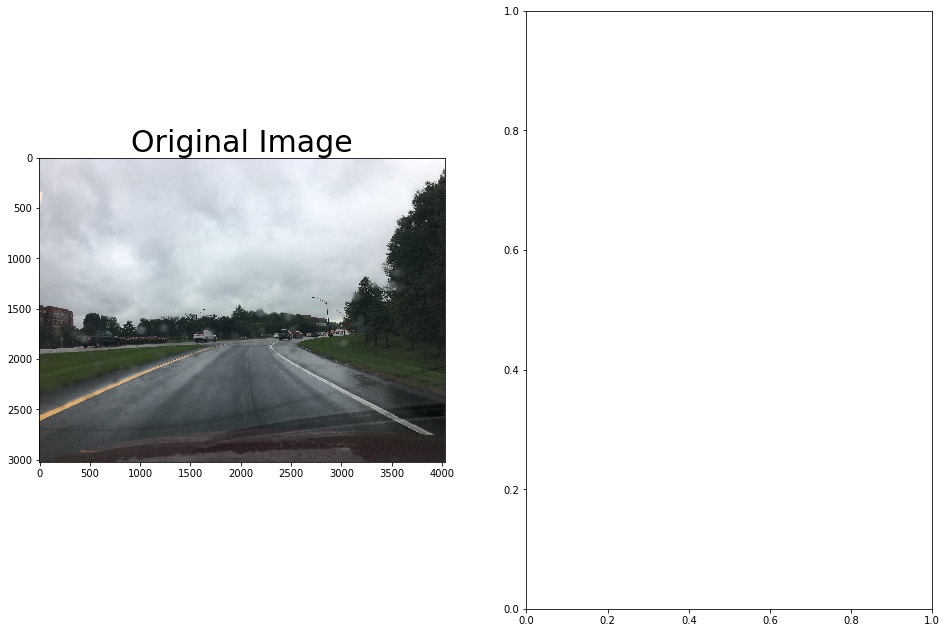

In [112]:
# Below is the pipeline that undistorts an image, then applies perspective transform to get birds eye view,
# then applies color and gradient thresholding to get a binary image, which is used to compute the histograms 
# and then to find lane pixels using sliding window approach

def advanced_lanes_pipeline(orig_image):
    
    # undistorting and perspective transforming image
    undist_img = undistort_image(orig_image, ret, mtx, dist)
    h,w = undist_img.shape[:2]
    #print(img_size)
    # Source points
    #src=np.float32([[270,720],[580,480],[800,480],[1200,720]])
    # destination points. Chosen these to get birds eye view
    #dst=np.float32([[350,720],[350,0],[960,0],[960,720]])

    src = np.float32(
    [[(w / 2) - 80, h / 2 + 100],
    [(w*0.1)+30, h],
    [(w * 5 / 6) + 100, h],
    [(w / 2 + 80), h / 2 + 100]])
    dst = np.float32(
    [[(w / 6), 0],
    [(w / 6), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
    
    
    src = np.float32(
    [[(w*0.5) - 140, h / 2 + 300],
    [(w*0.1)+50, h],
    [(w*0.8) + 50, h],
    [(w*0.5 + 90), h / 2 + 300]])
    dst = np.float32(
    [[(w / 5), 0],
    [(w / 5), h],
    [(w * 0.9), h],
    [(w * 0.9), 0]])
  
    
    #Applying Perspective Transform to save time and space complexities
    top_down_warped, perspective_M, Minv = perspective_transform(undist_img, ret, mtx, dist, src, dst)
    # Applying color transform and gradient thresholding
    color_grad_binary = color_gradient_threshold(top_down_warped, thresh= (170, 220), thresh_r= (200, 255), 
                                                    thresh_h= (20, 100), thresh_l= (25, 140), 
                                                    thresh_s= (40, 70), 
                                                       thresh_sx= (20, 250), thresh_sy= (10, 200), 
                                                       thresh_mag= (20, 140), thresh_dir= (0, 1.3),
                                                       ksize = 7 )
    
    
    out_img, left_fitx, right_fitx, leftx, lefty, rightx, righty = find_lane_pixels(color_grad_binary)
    
    new_img = np.copy(orig_image)
    warp_zero = np.zeros_like(color_grad_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    h,w = color_grad_binary.shape
    ploty = np.linspace(0, h-1, num=h)
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (255,0, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(0,255,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h), flags=cv2.INTER_LINEAR) 
    output = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
     
  
    # Curvature Computation
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    y_eval = np.max(ploty)
    # Fitting a second order polynomial to pixel positions in each fake lane line
    ##### Fittingnew polynomials to x,y in world space #####
    ##### Utilizing `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) 
    left_curverad = 0.5*((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(left_fit_cr[0])
    right_curverad = 0.5*((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(right_fit_cr[0])
    #avg_curve = np.mean([left_curverad, right_curverad])
    camera_center = 0.5*(left_fitx[0] + right_fitx[0])
    offset = (camera_center - undist_img.shape[1]/2)*xm_per_pix
    # We have radii of curvatures for left and right lanes. These two might be different. 
    # So, averaging both radii and displaying
    avg_curvature = np.mean([left_curverad, right_curverad])
    font=cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(output,'Radius of curvature is  = %.2f m'%(avg_curvature),(20,50), font, 1,(0,255,255),2,cv2.LINE_AA)
       
    if offset>0:
        text='Left'
    else:
        text='Right'
    cv2.putText(output,'Vehicle position is : %.2f m %s of center'%(abs(offset), text),(20,90),
                        font, 1,(0,255,255),2,cv2.LINE_AA)      
    return output


# Running each test image through pipeline
for i,dist_img in enumerate(dist_images):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 11))
    ax1.set_title('Original Image', fontsize=30)
    ax1.imshow(dist_img)
    #cv2.imwrite(os.path.join('pipeline_images2', 'pipeline_original_image'+str(i)+'.jpg'), cv2.cvtColor(dist_img, cv2.COLOR_RGB2BGR))  
    out_img = advanced_lanes_pipeline(dist_img)
    ax2.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(out_img)
    #cv2.imwrite(os.path.join('pipeline_images2', 'pipeline_image'+str(i)+'.jpg'), cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR))  
    
    

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
def process_image(image):
    plt.imshow(image)
    return advanced_lanes_pipeline(image)

In [ ]:
output_file = 'test_videos/project_video_output2.mp4'
project_video_output = 'video1.mp4'

clip1 = VideoFileClip("video1.mp4")
project_clip = clip1.fl_image(process_image)
%time project_clip.write_videofile(output_file, audio=False)